In [ ]:
from google.colab import drive  ## Mount Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
os.chdir('/content/drive/MyDrive/Urban/Urban_Shared_Analysis')

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
import pandas as pd
df = pd.read_csv('cases_by_county.csv')
df.head()

,Unnamed: 0,date,rolling_average_cases_per_100k_centered,state,name,fipscode
0,1,2020-02-08,0.0,AL,"Lee County, AL",1081
1,2,2020-02-11,0.0,AL,"Lee County, AL",1081
2,3,2020-02-14,0.0,AL,"Lee County, AL",1081
3,4,2020-02-18,0.0,AL,"Lee County, AL",1081
4,5,2020-02-20,0.0,AL,"Lee County, AL",1081


In [ ]:
df1 = pd.read_csv('wastewater_by_county.csv')
df1.head()

,Unnamed: 0,sampling_week,effective_concentration_rolling_average,region,state,name,fipscode
0,0,2020-01-01,134.841964,Midwest,IL,"Peoria County, IL",17143
1,1,2020-01-15,0.000000,Northeast,MA,"Suffolk County, MA",25025
2,2,2020-01-22,0.000000,Northeast,MA,"Suffolk County, MA",25025
3,3,2020-01-29,0.000000,Northeast,MA,"Suffolk County, MA",25025
4,4,2020-02-05,0.000000,Northeast,MA,"Suffolk County, MA",25025


In [ ]:
df1 = df1.rename(columns={"sampling_week": "date"})

In [ ]:
df1.head()

,Unnamed: 0,date,effective_concentration_rolling_average,region,state,name,fipscode
0,0,2020-01-01,134.841964,Midwest,IL,"Peoria County, IL",17143
1,1,2020-01-15,0.000000,Northeast,MA,"Suffolk County, MA",25025
2,2,2020-01-22,0.000000,Northeast,MA,"Suffolk County, MA",25025
3,3,2020-01-29,0.000000,Northeast,MA,"Suffolk County, MA",25025
4,4,2020-02-05,0.000000,Northeast,MA,"Suffolk County, MA",25025


In [ ]:
#result = df1.join(df, on=["date", "fipscode"], how="left")

merged = pd.merge(df1,df, on=['date','fipscode'])
# Print the result


In [ ]:
merged.drop(['name_x','state_x'],inplace=True,axis=1)

In [ ]:
merged.head()

,Unnamed: 0_x,date,effective_concentration_rolling_average,region,fipscode,Unnamed: 0_y,rolling_average_cases_per_100k_centered,state_y,name_y
0,3,2020-01-29,0.0,Northeast,25025,105741,0.01777,MA,"Suffolk County, MA"
1,4,2020-02-05,0.0,Northeast,25025,30149,0.00000,MA,"Suffolk County, MA"
2,5,2020-02-12,0.0,Northeast,25025,23025,0.00000,MA,"Suffolk County, MA"
3,6,2020-02-19,0.0,West,6079,37581,0.00000,CA,"San Luis Obispo County, CA"
4,7,2020-02-19,0.0,Northeast,25025,80294,0.00000,MA,"Suffolk County, MA"


In [3]:
#Uncomment to use
!#pip install plotly-geo==1.0.0
#!pip install geopandas==0.3.0
#!pip install pyshp==1.2.10
#!pip install shapely==1.6.3
#!pip install geopandas==0.8.1 

In [ ]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
#from utils.pos import pos
from IPython.display import Image 

In [2]:
#Uncoment to use
#!pip install --upgrade plotly
#!pip install --upgrade geopandas
#!pip install --upgrade pyshp
#!pip install --upgrade shapely

In [ ]:
import plotly.figure_factory as ff

fips = merged['fipscode'].values.tolist()
values = merged['rolling_average_cases_per_100k_centered'].values.tolist()

fig = ff.create_choropleth(fips=fips, values=values)
fig.layout.template = None
fig.show()

/usr/local/lib/python3.8/dist-packages/plotly/figure_factory/_county_choropleth.py:359: ShapelyDeprecationWarning:

Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.

/usr/local/lib/python3.8/dist-packages/plotly/figure_factory/_county_choropleth.py:363: ShapelyDeprecationWarning:

Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.

/usr/local/lib/python3.8/dist-packages/plotly/figure_factory/_county_choropleth.py:368: ShapelyDeprecationWarning:

Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.

/usr/local/lib/python3.8/dist-packages/plotly/figure_factory/_county_choropleth.py:369: ShapelyDeprecationWarning:

Iteration over multi-pa

KeyboardInterrupt: ignored

In [ ]:
type(df['fipscode'].values.tolist())

In [ ]:
import plotly.figure_factory as ff

fips = merged['fipscode'].values.tolist()
values = merged['effective_concentration_rolling_average'].values.tolist()

fig = ff.create_choropleth(fips=fips, values=values)
fig.layout.template = None
fig.show()

In [ ]:
merged.head()

,Unnamed: 0_x,date,effective_concentration_rolling_average,region,fipscode,Unnamed: 0_y,rolling_average_cases_per_100k_centered,state_y,name_y
0,3,2020-01-29,0.0,Northeast,25025,105741,0.01777,MA,"Suffolk County, MA"
1,4,2020-02-05,0.0,Northeast,25025,30149,0.00000,MA,"Suffolk County, MA"
2,5,2020-02-12,0.0,Northeast,25025,23025,0.00000,MA,"Suffolk County, MA"
3,6,2020-02-19,0.0,West,6079,37581,0.00000,CA,"San Luis Obispo County, CA"
4,7,2020-02-19,0.0,Northeast,25025,80294,0.00000,MA,"Suffolk County, MA"


In [ ]:
merged_1=merged.drop(columns=['Unnamed: 0_x', 'Unnamed: 0_y'])
merged_2=merged.drop(columns=['Unnamed: 0_x', 'Unnamed: 0_y'])
merged_1.rename(columns={"effective_concentration_rolling_average": "Wastewater Concentration", "rolling_average_cases_per_100k_centered": "Case Numbers"}, inplace=True)
merged_1.head()

,date,Wastewater Concentration,region,fipscode,Case Numbers,state_y,name_y
0,2020-01-29,0.0,Northeast,25025,0.01777,MA,"Suffolk County, MA"
1,2020-02-05,0.0,Northeast,25025,0.00000,MA,"Suffolk County, MA"
2,2020-02-12,0.0,Northeast,25025,0.00000,MA,"Suffolk County, MA"
3,2020-02-19,0.0,West,6079,0.00000,CA,"San Luis Obispo County, CA"
4,2020-02-19,0.0,Northeast,25025,0.00000,MA,"Suffolk County, MA"


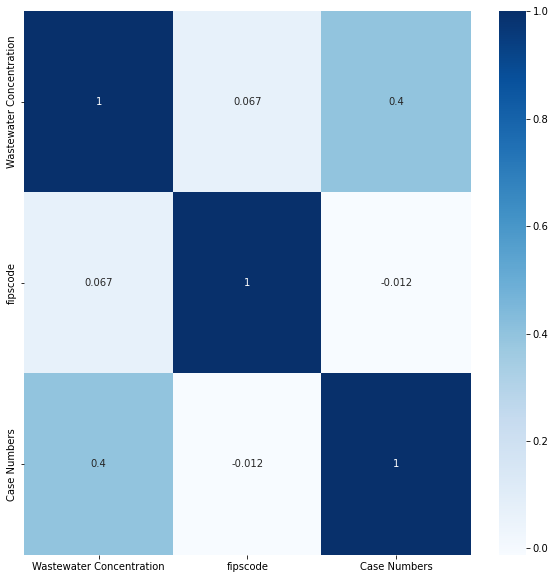

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pyplot import figure
corr = merged_1.corr()
figure(figsize=(10, 10))
sns.heatmap(corr, cmap="Blues", annot=True)

In [ ]:
merged.head()

,Unnamed: 0_x,date,effective_concentration_rolling_average,region,fipscode,Unnamed: 0_y,rolling_average_cases_per_100k_centered,state_y,name_y
0,3,2020-01-29,0.0,Northeast,25025,105741,0.01777,MA,"Suffolk County, MA"
1,4,2020-02-05,0.0,Northeast,25025,30149,0.00000,MA,"Suffolk County, MA"
2,5,2020-02-12,0.0,Northeast,25025,23025,0.00000,MA,"Suffolk County, MA"
3,6,2020-02-19,0.0,West,6079,37581,0.00000,CA,"San Luis Obispo County, CA"
4,7,2020-02-19,0.0,Northeast,25025,80294,0.00000,MA,"Suffolk County, MA"


In [ ]:
merged_2['date'] =  pd.to_datetime(merged_2['date'])

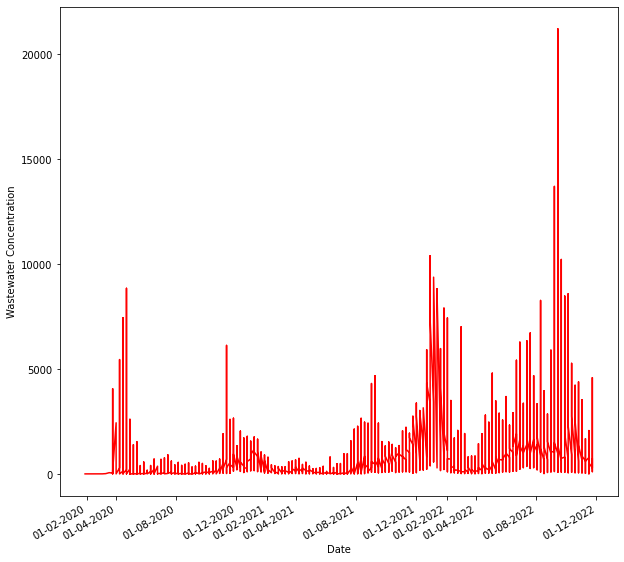

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Process dataset
#bitcoin['Date'] = pd.to_datetime(bitcoin['Date'])
#bitcoin['Open'] = pd.to_numeric(bitcoin['Open'])

# Plot
#figure(figsize=(20, 20))
plt.figure(figsize=(10, 10))
plt.plot(merged_2['date'], merged_2['effective_concentration_rolling_average'],color="red")
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=[2,4,8,12]))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))
ax.set_xlabel("Date")
ax.set_ylabel("Wastewater Concentration")
plt.gcf().autofmt_xdate() # Rotation

plt.show()

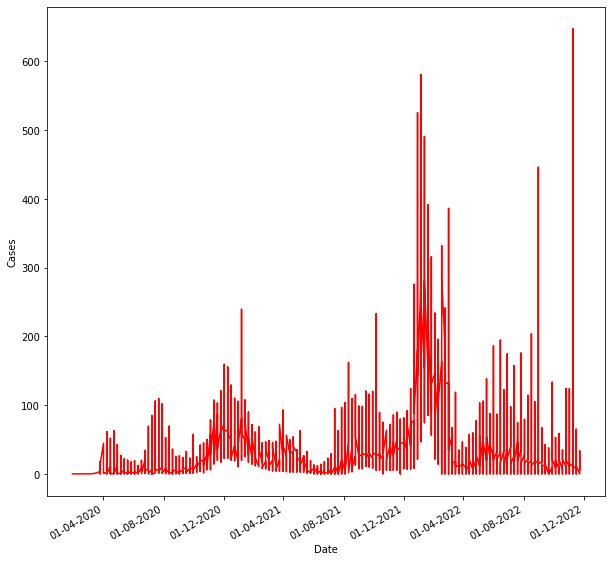

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Process dataset
#bitcoin['Date'] = pd.to_datetime(bitcoin['Date'])
#bitcoin['Open'] = pd.to_numeric(bitcoin['Open'])

# Plot
#figure(figsize=(20, 20))
plt.figure(figsize=(10, 10))
plt.plot(merged_2['date'], merged_2['rolling_average_cases_per_100k_centered'],color="red")
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=[4,8,12]))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))
ax.set_xlabel("Date")
ax.set_ylabel("Cases")
plt.gcf().autofmt_xdate() # Rotation

plt.show()

In [ ]:
final_df = merged.drop(['Unnamed: 0_x','date','Unnamed: 0_y'],axis = 1)

In [ ]:
final_df.head()

,effective_concentration_rolling_average,region,fipscode,rolling_average_cases_per_100k_centered,state_y,name_y
0,0.0,Northeast,25025,0.01777,MA,"Suffolk County, MA"
1,0.0,Northeast,25025,0.00000,MA,"Suffolk County, MA"
2,0.0,Northeast,25025,0.00000,MA,"Suffolk County, MA"
3,0.0,West,6079,0.00000,CA,"San Luis Obispo County, CA"
4,0.0,Northeast,25025,0.00000,MA,"Suffolk County, MA"


In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
final_df["region"] = le.fit_transform(final_df.region)
final_df["name_y"] = le.fit_transform(final_df.name_y)
final_df["state_y"] = le.fit_transform(final_df.state_y)


In [ ]:
final_df.head()

,effective_concentration_rolling_average,region,fipscode,rolling_average_cases_per_100k_centered,state_y,name_y
0,0.0,1,25025,0.01777,19,214
1,0.0,1,25025,0.00000,19,214
2,0.0,1,25025,0.00000,19,214
3,0.0,3,6079,0.00000,4,195
4,0.0,1,25025,0.00000,19,214


In [ ]:
##PREDICTION

In [ ]:
y = final_df['rolling_average_cases_per_100k_centered']
final_df.drop(['rolling_average_cases_per_100k_centered'],inplace=True,axis=1)

In [ ]:
from sklearn.model_selection import train_test_split

# split into train test sets
X_train, X_test, y_train, y_test = train_test_split(final_df, y, test_size=0.1)

In [ ]:
from sklearn.datasets import make_regression
from sklearn.ensemble import RandomForestRegressor
# define dataset

# define the model
model = RandomForestRegressor()
# fit the model on the whole dataset
model.fit(X_train, y_train)

RandomForestRegressor()

In [ ]:
pred = model.predict(X_test)

In [ ]:
my_submission = pd.DataFrame({'Predicted Covid Cases': pred.ravel(), 'True Covid Cases':y_test})
# you could use any filename. We choose submission here


In [ ]:
my_submission[:50]

,Predicted Covide Cases,True Covid Cases
4421,3.790641,6.531598
6651,26.547499,27.325179
4689,11.850024,0.000000
4593,30.462950,19.995083
3731,11.611011,36.203065
7991,53.067888,0.000000
8461,42.122706,13.403084
4267,6.981583,4.014235
6071,22.283393,27.153247
9186,13.313053,12.437783


In [ ]:
my_submission.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1051 entries, 1327 to 2211
Data columns (total 2 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Predicted Covide Cases  1051 non-null   float64
 1   True Covid Cases        1051 non-null   float64
dtypes: float64(2)
memory usage: 24.6 KB


In [ ]:
my_submission['True Covid Cases'] = my_submission['True Covid Cases'].astype(int)

In [ ]:
len(my_submission)

1051

In [ ]:
my_submission= my_submission[my_submission['True Covid Cases'] != 0]

In [ ]:
my_submission.head()

,Predicted Covide Cases,True Covid Cases
1327,9.136974,11
1183,25.663828,28
1571,9.367979,26
818,4.087286,6
4742,8.005063,1


In [ ]:
##my_submission.to_csv('/content/drive/MyDrive/Urban/pred.csv')

In [ ]:
len(my_submission)

889

In [ ]:
my_submission[:50]

,Predicted Covide Cases,True Covid Cases
1327,9.136974,11
1183,25.663828,28
1571,9.367979,26
818,4.087286,6
4742,8.005063,1
9963,16.781017,6
4179,33.320537,16
8818,31.972303,20
10436,34.565586,7
6886,42.570771,36


In [ ]:
my_submission= my_submission[my_submission['True Covid Cases'] !=0.000000 ]

In [ ]:
my_submission.head()

,Predicted Covide Cases,True Covid Cases
1327,9.136974,11
1183,25.663828,28
1571,9.367979,26
818,4.087286,6
4742,8.005063,1


In [ ]:
##my_submission.to_csv('prediction_rf.csv')

In [ ]:
ls

adult.data           CONAN/                       prediction_rf.csv
adult_data.csv       DIALOCONAN/                  prediction_rf.gsheet
adult.names          hospitals_with_waste.csv     predictions_ANN.csv
adult.test           imgs/                        predictions_DT.csv
adult_test_1.csv     lp_adf_final.csv             prediction.xlsx
adult_test.csv       Multitarget-CONAN/           RQ2_Excel.csv
bed.csv              multitarget_KN_grounded_CN/  Rq2.jpg
cases_by_county.csv  pred.csv                     wastewater_by_county.csv


In [1]:
#!pip install rfpimp


In [ ]:
from sklearn.metrics import r2_score
from rfpimp import permutation_importances

def r2(rf, X_train, y_train):
    return r2_score(y_train, rf.predict(X_train))

perm_imp_rfpimp = permutation_importances(model, X_train, y_train, r2)

In [ ]:
perm_imp_rfpimp

,Importance
Feature,
effective_concentration_rolling_average,1.353285
fipscode,0.442933
name_y,0.304503
state_y,0.275479
region,0.163796


In [ ]:
from rfpimp import *

In [ ]:
from keras.models import Sequential
from keras.layers import Dense
from keras.callbacks import EarlyStopping 
from keras.optimizers import Adam, SGD
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
import numpy as np
import pandas as pd
import pywt
import matplotlib.pyplot as plt
import tensorflow as tf
from keras.models import Model
import keras.layers as kl
from keras.layers import Input, Dense
import keras as kr
from keras.layers import Activation
from keras import backend as K
from keras.utils.generic_utils import get_custom_objects

In [ ]:
X_train.shape

(9458, 5)

In [ ]:
model = Sequential()

model.add(Dense(64, input_dim=5, kernel_initializer='normal', activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(16, activation='relu'))
model.add(Dense(1))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                384       
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 16)                528       
                                                                 
 dense_3 (Dense)             (None, 1)                 17        
                                                                 
Total params: 3,009
Trainable params: 3,009
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse','mae'])

In [ ]:
history = model.fit(X_train, y_train, epochs=200, batch_size=24)

Epoch 1/200
395/395 [==============================] - 2s 2ms/step - loss: 78008.0469 - mse: 78008.0469 - mae: 62.4738
Epoch 2/200
395/395 [==============================] - 1s 2ms/step - loss: 1224.1394 - mse: 1224.1394 - mae: 18.6658
Epoch 3/200
395/395 [==============================] - 1s 2ms/step - loss: 1167.4044 - mse: 1167.4044 - mae: 18.5450
Epoch 4/200
395/395 [==============================] - 1s 2ms/step - loss: 1155.9822 - mse: 1155.9822 - mae: 18.4252
Epoch 5/200
395/395 [==============================] - 1s 2ms/step - loss: 1162.5454 - mse: 1162.5454 - mae: 18.8553
Epoch 6/200
395/395 [==============================] - 1s 2ms/step - loss: 1176.2788 - mse: 1176.2788 - mae: 19.0841
Epoch 7/200
395/395 [==============================] - 1s 2ms/step - loss: 1184.0148 - mse: 1184.0148 - mae: 18.8940
Epoch 8/200
395/395 [==============================] - 1s 2ms/step - loss: 1160.7467 - mse: 1160.7467 - mae: 18.8265
Epoch 9/200
395/395 [==============================] - 1s 2ms/

In [ ]:
y_pred_ann = model.predict(X_test)

33/33 [==============================] - 0s 1ms/step


In [ ]:
my_submission_ann = pd.DataFrame({'Predicted Covid Cases': y_pred_ann.ravel(), 'True Covid Cases':y_test})


In [ ]:
my_submission_ann

,Predicted Covid Cases,True Covid Cases
8214,85.427391,26.843636
4206,9.856202,8.700286
7290,32.202999,39.632615
9714,31.004726,0.000000
6915,33.180340,0.000000
...,...,...
2934,10.813554,19.232809
3054,22.216209,13.987014
1875,7.237760,1.316471
8808,22.408340,8.371263


In [ ]:
my_submission_ann.to_csv('predictions_ANN.csv')

In [ ]:
##DT
from sklearn.tree import DecisionTreeRegressor
model_dt = DecisionTreeRegressor()
model_dt.fit(X_train,y_train)

DecisionTreeRegressor()

In [ ]:
pred_dt = model_dt.predict(X_test)

In [ ]:
my_submission_dt= pd.DataFrame({'Predicted Covide Cases': pred_dt.ravel(), 'True Covid Cases':y_test})

In [ ]:
my_submission_dt

,Predicted Covide Cases,True Covid Cases
8214,97.868254,26.843636
4206,13.710719,8.700286
7290,16.229546,39.632615
9714,0.000000,0.000000
6915,0.000000,0.000000
...,...,...
2934,39.019884,19.232809
3054,24.331023,13.987014
1875,10.762148,1.316471
8808,24.710640,8.371263


In [ ]:
my_submission_dt.to_csv('predictions_DT.csv')

In [ ]:

#northeast
df_ma = merged[merged['name_y'] == 'Suffolk County, MA']

#south
df_s = merged[merged['name_y'] == 'Lowdnes County, GA']
#west
df_w = merged[merged['name_y'] == ', GA']
#midwest

In [ ]:
df_dem = merged[merged['name_y'] == 'Suffolk County, MA']
df_rep = merged[merged['name_y'] == '']

In [ ]:
df_new = merged[merged['name_y'] == 'Suffolk County, MA']


In [ ]:
df_new.head()

,Unnamed: 0_x,date,effective_concentration_rolling_average,region,fipscode,Unnamed: 0_y,rolling_average_cases_per_100k_centered,state_y,name_y
0,3,2020-01-29,0.0,Northeast,25025,105741,0.01777,MA,"Suffolk County, MA"
1,4,2020-02-05,0.0,Northeast,25025,30149,0.00000,MA,"Suffolk County, MA"
2,5,2020-02-12,0.0,Northeast,25025,23025,0.00000,MA,"Suffolk County, MA"
4,7,2020-02-19,0.0,Northeast,25025,80294,0.00000,MA,"Suffolk County, MA"
5,8,2020-02-26,0.0,Northeast,25025,80296,0.00000,MA,"Suffolk County, MA"


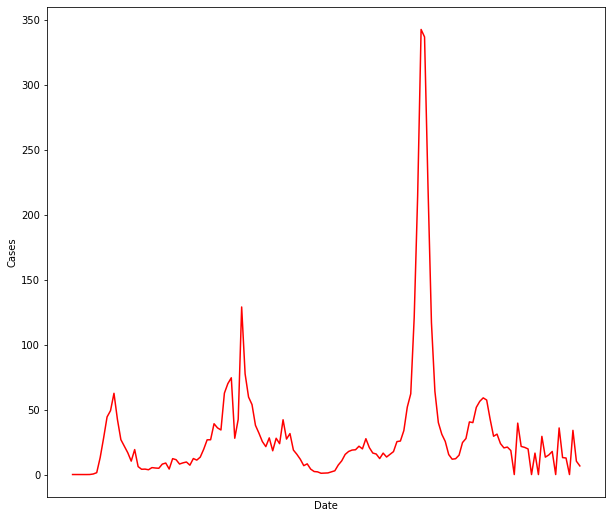

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Process dataset
#bitcoin['Date'] = pd.to_datetime(bitcoin['Date'])
#bitcoin['Open'] = pd.to_numeric(bitcoin['Open'])

# Plot
#figure(figsize=(20, 20))
plt.figure(figsize=(10, 10))
plt.plot(df_new['date'], df_new['rolling_average_cases_per_100k_centered'],color="red")
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))
ax.set_xlabel("Date")
ax.set_ylabel("Cases")
plt.gcf().autofmt_xdate() # Rotation

plt.show()

In [ ]:
#### Tracing Covid 19 through usa using SIR model , correlating this with real spread

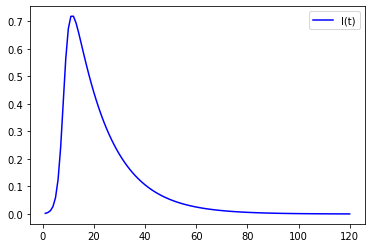

In [ ]:
from scipy.integrate import odeint
import numpy as np
import matplotlib.pyplot as plt

# DEFINE CONSTANTS
a = 0.9 # infection rate
b = 1/14 # recovery rate

# FUNCTION TO RETURN DERIVATIVES AT T
def f(y,t):
	S, I, _ = y # get previous values of S, I, R and store them in array y
	d0 = -a*S*I # derivative of S(t)
	d1 = a*S*I - b*I # derivative of I(t)
	d2 = b*I # derivative of R(t)

	return [d0, d1, d2]

# INITIAL VALUES OF EACH FUNCTION 
S_0 = 1
I_0 = 1777/(771245)
R_0 = 0
y_0 = [S_0,I_0,R_0]

t = np.linspace(start=1,stop=120,num=120)
y = odeint(f,y_0,t) 

S = y[:,0]
I = y[:,1]
R = y[:,2]

plt.figure()
#plt.plot(t,S,"r",label="S(t)")
plt.plot(t,I,'b',label="I(t)")
#plt.plot(t,R,'g',label="R(t)")
plt.legend()
plt.show()

In [ ]:
merged1 = merged.drop(['date','Unnamed: 0_x'],axis=1)

In [ ]:
merged1.head()

,effective_concentration_rolling_average,region,fipscode,Unnamed: 0_y,rolling_average_cases_per_100k_centered,state_y,name_y
0,0.0,Northeast,25025,105741,0.01777,MA,"Suffolk County, MA"
1,0.0,Northeast,25025,30149,0.00000,MA,"Suffolk County, MA"
2,0.0,Northeast,25025,23025,0.00000,MA,"Suffolk County, MA"
3,0.0,West,6079,37581,0.00000,CA,"San Luis Obispo County, CA"
4,0.0,Northeast,25025,80294,0.00000,MA,"Suffolk County, MA"


In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
merged1["region"] = le.fit_transform(merged1.region)
merged1["name_y"] = le.fit_transform(merged1.name_y)
merged1["state_y"] = le.fit_transform(merged1.state_y)


In [ ]:
merged1.head()

,effective_concentration_rolling_average,region,fipscode,Unnamed: 0_y,rolling_average_cases_per_100k_centered,state_y,name_y
0,0.0,1,25025,105741,0.01777,19,214
1,0.0,1,25025,30149,0.00000,19,214
2,0.0,1,25025,23025,0.00000,19,214
3,0.0,3,6079,37581,0.00000,4,195
4,0.0,1,25025,80294,0.00000,19,214


In [ ]:
from sklearn import datasets
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA


# Declaring Model
model = KMeans(n_clusters=3)

# Fitting Model
model.fit(merged1)

# Predicitng a single input
#predicted_label = model.predict([[7.2, 3.5, 0.8, 1.6]])

# Prediction on the entire data
all_predictions = model.predict(merged1)

# Printing Predictions
#print(predicted_label)
print(all_predictions)



[2 0 0 ... 2 2 0]


In [ ]:
rf1 = pd.read_csv('predictions_DT.csv')

In [ ]:
rf1.head()

,Unnamed: 0,Predicted Covide Cases,True Covid Cases
0,370,6.882194,0.860274
1,4952,18.311321,38.432719
2,10122,25.970063,13.313218
3,5169,14.043592,31.988183
4,3172,13.234969,19.821840


In [ ]:
import numpy as np

def mae(y_true, predictions):
    y_true, predictions = np.array(y_true), np.array(predictions)
    return np.mean(np.abs(y_true - predictions))

In [ ]:
mae(rf1['True Covid Cases'],rf1['Predicted Covide Cases'])

18.798870657860917

In [ ]:
from sklearn.metrics import r2_score

coefficient_of_dermination = r2_score(rf1['True Covid Cases'], rf1['Predicted Covide Cases'])

In [ ]:
coefficient_of_dermination

-0.6037117386799009